### LLM Agent Collective Belief Formation Simulation
### Modified Version with Asynchronous Processing, Prompt-based Updates, and Flexible Network Topology

This notebook implements a simulation of LLM agents forming collective beliefs through conversations.

### Key Modifications:
1. **Asynchronous Parallel Processing**: Agents can have simultaneous conversations
2. **Prompt-based Belief Updates**: LLMs self-determine belief modifications
3. **Flexible Network Topology**: Support for random, fully connected, and custom networks

### Implementation Notes:
- The LLMInterface class provides a placeholder for LLM API integration
- Replace the `generate_response()` method with your preferred LLM API (OpenAI, Anthropic, etc.)
- The simulation runs without a real LLM API for testing purposes using mock responses

In [18]:
# Import required libraries
import os
import asyncio
import nest_asyncio
import numpy as np
import random
import networkx as nx
import matplotlib.pyplot as plt
from typing import List, Dict, Tuple, Optional, Any
import json
import logging
from dataclasses import dataclass, field
from enum import Enum
import time
from concurrent.futures import ThreadPoolExecutor
from openai import OpenAI
from openai import AsyncOpenAI
import re

# Apply nest_asyncio to allow async in Jupyter
nest_asyncio.apply()

# Configure logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

In [19]:
nodesize = 200
agents = 100
steps = 30
from dotenv import load_dotenv
load_dotenv()
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY")

### Network Topology Configuration

In [20]:
class NetworkType(Enum):
    """Enum for different network topology types"""
    LATTICE = "lattice"
    RANDOM = "random"
    FULLY_CONNECTED = "fully_connected"
    CUSTOM = "custom"
    SMALL_WORLD = "small_world"
    SCALE_FREE = "scale_free"

class NetworkTopology:
    """Class to handle different network topologies"""
    
    def __init__(self, network_type: NetworkType, num_agents: int, **kwargs):
        self.network_type = network_type
        self.num_agents = num_agents
        self.kwargs = kwargs
        self.graph = self._create_network()
    
    def _create_network(self) -> nx.Graph:
        """Create network based on specified type"""
        if self.network_type == NetworkType.LATTICE:
            # Create 2D lattice (grid)
            size = int(np.sqrt(self.num_agents))
            if size * size != self.num_agents:
                raise ValueError(f"For lattice network, num_agents must be a perfect square. Got {self.num_agents}")
            return nx.grid_2d_graph(size, size)
        
        elif self.network_type == NetworkType.RANDOM:
            # Create random network with specified edge probability
            edge_prob = self.kwargs.get('edge_probability', 0.3)
            return nx.erdos_renyi_graph(self.num_agents, edge_prob)
        
        elif self.network_type == NetworkType.FULLY_CONNECTED:
            # Create fully connected network
            return nx.complete_graph(self.num_agents)
        
        elif self.network_type == NetworkType.SMALL_WORLD:
            # Create small-world network (Watts-Strogatz)
            k = self.kwargs.get('k', 4)  # Each node connected to k nearest neighbors
            p = self.kwargs.get('p', 0.3)  # Rewiring probability
            return nx.watts_strogatz_graph(self.num_agents, k, p)
        
        elif self.network_type == NetworkType.SCALE_FREE:
            # Create scale-free network (Barabási-Albert)
            m = self.kwargs.get('m', 2)  # Number of edges to attach from new node
            return nx.barabasi_albert_graph(self.num_agents, m)
        
        elif self.network_type == NetworkType.CUSTOM:
            # Create custom network from provided adjacency matrix or edge list
            if 'adjacency_matrix' in self.kwargs:
                adj_matrix = self.kwargs['adjacency_matrix']
                return nx.from_numpy_array(adj_matrix)
            elif 'edge_list' in self.kwargs:
                G = nx.Graph()
                G.add_nodes_from(range(self.num_agents))
                G.add_edges_from(self.kwargs['edge_list'])
                return G
            else:
                raise ValueError("Custom network requires 'adjacency_matrix' or 'edge_list'")
        
        else:
            raise ValueError(f"Unknown network type: {self.network_type}")
    
    def get_neighbors(self, agent_id: int) -> List[int]:
        """Get list of neighbors for a specific agent"""
        if self.network_type == NetworkType.LATTICE:
            # Convert 2D position to 1D agent ID
            size = int(np.sqrt(self.num_agents))
            row, col = agent_id // size, agent_id % size
            neighbors = list(self.graph.neighbors((row, col)))
            # Convert back to 1D IDs
            return [n[0] * size + n[1] for n in neighbors]
        else:
            return list(self.graph.neighbors(agent_id))
    
    def visualize(self, agent_beliefs: Optional[Dict[int, float]] = None, ax=None, show=True):
        """Visualize the network topology"""
        if ax is None:
            fig, ax = plt.subplots(figsize=(10, 8))
            created_figure = True
        else:
            created_figure = False
        
        # Set positions based on network type
        if self.network_type == NetworkType.LATTICE:
            size = int(np.sqrt(self.num_agents))
            pos = {}
            for i in range(self.num_agents):
                row, col = i // size, i % size
                pos[(row, col)] = (col, -row)
        else:
            pos = nx.spring_layout(self.graph, k=2, iterations=100)
        
        # Color nodes based on beliefs if provided
        if agent_beliefs:
            if self.network_type == NetworkType.LATTICE:
                # Convert beliefs dict to match lattice node format
                size = int(np.sqrt(self.num_agents))
                node_colors = []
                for node in self.graph.nodes():
                    agent_id = node[0] * size + node[1]
                    node_colors.append(agent_beliefs.get(agent_id, 0.0))
            else:
                node_colors = [agent_beliefs.get(i, 0.0) for i in self.graph.nodes()]
            
            # Draw network with colors
            nx.draw(self.graph, pos, node_color=node_colors, cmap='coolwarm', 
                    vmin=0, vmax=1, with_labels=True, node_size=nodesize, ax=ax)
            
            # Add colorbar only if we created our own figure
            if created_figure:
                sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=0, vmax=1))
                sm.set_array([])
                plt.colorbar(sm, label='Belief Value', ax=ax)
        else:
            nx.draw(self.graph, pos, with_labels=True, node_size=nodesize, ax=ax)
        
        ax.set_title(f"Network Topology: {self.network_type.value}")
        
        if created_figure and show:
            plt.show()

### LLM Interface Configuration

In [21]:
@dataclass
class LLMConfig:
    """Configuration for LLM API"""
    model_name: str = "gpt-4o-mini"  # Can be changed to any LLM
    temperature: float = 0.7
    max_tokens: int = 300
    api_key: Optional[str] = OPENAI_API_KEY
    api_base: Optional[str] = None

class LLMInterface:
    """Interface for LLM interactions with conversation context"""
    
    def __init__(self, llm_config):
        self.config = llm_config
        self.client = AsyncOpenAI(api_key=llm_config.api_key)
        self.model = llm_config.model_name
    
    async def generate_response(
        self, 
        prompt: str, 
        system_prompt: Optional[str] = None,
        conversation: Optional[List[Dict[str, str]]] = None,
        speaker_id: Optional[int] = None,
        other_id: Optional[int] = None
        ) -> str:

        # Modification point: Replace the default system prompt in the generate_response method of LLMInterface class
        if system_prompt is None:
            system_prompt = (
                f"You are Agent {speaker_id} following Collective Predictive Coding (CPC) principles. "
                "Your responses should:\n"
                "1. Minimize prediction error by aligning with shared collective understanding\n"
                "2. Maintain consistency with your internal model while being open to collective knowledge\n" 
                "3. Contribute to forming shared external representations through communication\n"
                "4. Balance individual perspective with collective consensus\n"
                "Your goal is to reach understanding through minimizing collective free energy."
            )

        messages = [{"role": "system", "content": system_prompt}]
        
        # Add conversation history from the current speaker's perspective
        if conversation:
            for msg in conversation:
                # Determine the speaker of the message
                if f"Agent {speaker_id}:" in msg.get("content", ""):
                    # Record own utterances as "assistant"
                    role = "assistant"
                    # Extract only content by removing agent ID
                    content = msg["content"].replace(f"Agent {speaker_id}: ", "")
                elif f"Agent {other_id}:" in msg.get("content", "") if other_id else True:
                    # Record other's utterances as "user"
                    role = "user"
                    # Extract only content by removing agent ID
                    content = msg["content"].replace(f"Agent {other_id}: ", "") if other_id else msg["content"]
                else:
                    # Use as is for other cases
                    role = msg.get("role", "user")
                    content = msg.get("content", "")
                
                messages.append({"role": role, "content": content})
        
        # Add current prompt
        messages.append({"role": "user", "content": prompt})
        
        try:
            response = await self.client.chat.completions.create(
                model=self.model,
                messages=messages,
                temperature=self.config.temperature,
                max_tokens=self.config.max_tokens
            )
            return response.choices[0].message.content
        except Exception as e:
            # Error handling
            print(f"Error calling LLM API: {e}")
            # Fallback response
            return f"I understand your point about: {prompt[:50]}..."
    
    async def evaluate_belief_change(
        self, 
        current_belief: float, 
        conversation: List[Dict[str, str]], 
        topic: str,
        agent_id: int
    ) -> float:
        """
        Use LLM to evaluate how belief should change based on conversation
        
        Args:
            current_belief: Current belief level (-1 - 1)
            conversation: Full conversation history
            topic: Discussion topic
            agent_id: ID of the agent whose belief is being evaluated
        """
        # Convert conversation to string format
        conversation_text = "\n".join([msg["content"] for msg in conversation])
        
        prompt = f"""
            You are Agent {agent_id} with a current belief level of {current_belief:.2f} on a scale from -1 to 1 about the topic: "{topic}".

            You just had the following conversation:
            {conversation_text}

            Based on this conversation, evaluate how your belief should change. Consider:
            1. The strength and logic of arguments presented
            2. New information or perspectives shared
            3. How convincing the other agent's points were
            4. Whether your initial position was challenged effectively

            Respond with ONLY a number between -1 and 1 representing your new belief level.
            Do not include any explanation, just the number.
        """
        
        system_prompt = (
            "You are a rational agent who updates beliefs based on evidence and argumentation. "
            "Be open to changing your mind if presented with compelling arguments, "
            "but also maintain your position if the arguments are weak."
        )
        
        response = await self.generate_response(
            prompt=prompt,
            system_prompt=system_prompt,
            conversation=None  # Don't include conversation history during evaluation (already included in prompt)
        )
        
        # Extract number from response
        try:
            # Extract numbers
            numbers = re.findall(r'-?\d*\.?\d+', response)
            if numbers:
                new_belief = float(numbers[0])
                # Constrain belief value to [-1, 1] range
                return max(-1.0, min(1.0, new_belief))
        except:
            pass
        
        # Return small random change if parsing fails
        return current_belief + random.uniform(-0.1, 0.1)

### Agent Implementation with Asynchronous Conversations

In [22]:
class Agent:
    def __init__(self, agent_id, llm_interface=None, initial_belief=None, latent_dim=10):
        """Initialize an agent with CPC framework"""
        self.agent_id = agent_id
        self.llm_interface = llm_interface
        
        # CPC components
        self.latent_dim = latent_dim
        self.z = np.random.randn(latent_dim)  # Internal representation (z^k)
        self.w_estimate = np.random.randn(latent_dim)  # Agent's estimate of shared representation
        self.learning_rate = 0.1
        
        # Initialize belief from internal representation
        if initial_belief is None:
            self.belief = np.tanh(np.mean(self.z))  # Belief derived from internal state
        else:
            self.belief = initial_belief
            
        self.neighbors = []
        self.conversation_history = []  # List for tracking conversation count
        self.conversation_history_dict = {}  # Dict for storing actual conversations
        self.observations = []  # Store observations (o^k)
        self.prediction_accuracy = 1.0  # Initialize prediction accuracy

    def add_neighbor(self, neighbor):
        """Add a neighbor to this agent's network"""
        if neighbor not in self.neighbors:
            self.neighbors.append(neighbor)

    async def create_argument(self, topic, shared_representation=None):
        """Create an initial argument following CPC principles"""
        if not self.llm_interface:
            return f"I believe in this topic with strength {self.belief:.2f}."
        
        try:
            # Encode internal state and shared representation estimate
            internal_state_desc = f"Internal model strength: {np.linalg.norm(self.z):.2f}"
            
            # Check if agent has w_estimate attribute
            if hasattr(self, 'w_estimate') and shared_representation is not None:
                shared_estimate_desc = f"Alignment with collective: {np.dot(self.z, self.w_estimate):.2f}"
            else:
                shared_estimate_desc = "No collective baseline yet"
            
            prompt = f"""
            Topic: {topic}
            Your current belief strength (-1 to 1): {self.belief:.2f}
            {internal_state_desc}
            {shared_estimate_desc}
            
            Following Collective Predictive Coding principles:
            1. Express your view while considering potential collective understanding
            2. Minimize prediction error by being clear and coherent
            3. Allow for emergence of shared meaning through your expression
            
            Create a brief argument (2-3 sentences) that reflects both your internal model and openness to collective alignment.
            """
            
            response = await self.llm_interface.generate_response(
                prompt=prompt,
                system_prompt="You are a CPC agent balancing individual understanding with collective coherence.",
                speaker_id=self.agent_id
            )
            
            return response
            
        except Exception as e:
            logger.error(f"Error creating CPC argument for agent {self.agent_id}: {e}")
            return f"I believe the topic with strength {self.belief:.2f}."

    async def respond_to_argument(self, other_argument, topic, other_agent_id):
        """Respond to another agent's argument"""
        if not self.llm_interface:
            # Fallback if no LLM interface
            return f"I maintain my belief with strength {self.belief:.2f}."
        
        try:
            prompt = f"""
            Topic: {topic}
            Your current belief strength (-1 - 1): {self.belief:.2f}
            
            Agent {other_agent_id} said: {other_argument}
            
            Respond to their argument based on your belief level.
            If you agree, acknowledge it. If you disagree, counter it.
            Keep it to 2-3 sentences.
            """
            
            response = await self.llm_interface.generate_response(
                prompt=prompt,
                system_prompt="You are an agent in a belief formation simulation."
            )
            
            return response
            
        except Exception as e:
            logger.error(f"Error responding for agent {self.agent_id}: {e}")
            return f"I maintain my belief with strength {self.belief:.2f}."
    
    async def extract_conversation_embedding(self, conversation: str) -> np.ndarray:
        """Extract latent representation from conversation content"""
        if not self.llm_interface:
            # Fallback: random perturbation
            return np.random.randn(self.latent_dim) * 0.1
        
        prompt = f"""
        Analyze this conversation and identify {self.latent_dim} key semantic dimensions.
        Rate each dimension from -1 to 1 based on the conversation content.
        
        Conversation:
        {conversation}
        
        Consider dimensions like:
        - Optimism vs Pessimism about the topic
        - Certainty vs Uncertainty
        - Individual focus vs Collective focus
        - Short-term vs Long-term perspective
        - Emotional vs Rational approach
        - Conservative vs Progressive stance
        - Practical vs Theoretical orientation
        - Risk-averse vs Risk-taking
        - Human-centric vs Technology-centric
        - Local vs Global perspective
        
        Return ONLY {self.latent_dim} numbers separated by commas, e.g.: 0.5,-0.3,0.8,...
        """
        
        try:
            response = await self.llm_interface.generate_response(
                prompt=prompt,
                system_prompt=f"Extract {self.latent_dim} semantic dimensions from conversations.",
                speaker_id=self.agent_id
            )
            
            # Extract numbers
            numbers = re.findall(r'-?\d*\.?\d+', response)
            if len(numbers) >= self.latent_dim:
                embedding = np.array([float(n) for n in numbers[:self.latent_dim]])
                # Normalize
                embedding = np.clip(embedding, -1, 1)
                return embedding
            else:
                return np.random.randn(self.latent_dim) * 0.1
                
        except Exception as e:
            logger.error(f"Error extracting conversation embedding: {e}")
            return np.random.randn(self.latent_dim) * 0.1

    async def update_cpc_belief_improved(self, conversation, other_agent, shared_representation=None):
        """Improved version: directly reflect conversation content in internal representation"""
        
        # 1. Extract latent representation from conversation
        conversation_embedding = await self.extract_conversation_embedding(conversation)
        
        # 2. Belief evaluation by LLM (existing process)
        if self.llm_interface:
            # ... existing prompt processing ...
            new_belief = await self._get_llm_belief_update(conversation, other_agent)
        else:
            new_belief = self._simple_belief_update(other_agent)
        
        # 3. Improved internal representation update
        self._update_internal_representation_with_conversation(
            other_agent, 
            new_belief, 
            conversation_embedding
        )

    def _update_internal_representation_with_conversation(
        self, 
        other_agent, 
        new_belief, 
        conversation_embedding
        ):
        """Update internal representation considering conversation content"""
        
        # Get conversation history length
        conv_count = len(self.conversation_history) if isinstance(self.conversation_history, list) else 0
        
        # 1. Update direction based on conversation content
        conversation_gradient = conversation_embedding - self.z
        
        # 2. Prediction error gradient (difference from other agent's internal state)
        prediction_error = other_agent.z - self.z
        
        # 3. Collective regularization gradient
        collective_gradient = self.w_estimate - self.z
        
        # 4. Belief value consistency gradient
        # Difference between belief value derived from current internal representation and target belief value
        current_belief_from_z = np.tanh(np.mean(self.z))
        belief_error = new_belief - current_belief_from_z
        belief_gradient = belief_error * np.ones(self.latent_dim) / self.latent_dim
        
        # Adaptive learning rate
        prediction_error_magnitude = np.linalg.norm(prediction_error)
        conversation_impact = np.linalg.norm(conversation_gradient)
        adaptive_lr = self.learning_rate * np.exp(-prediction_error_magnitude / 5.0)
        
        # Time-dependent weights (strengthen collective influence as conversations progress)
        conversation_weight = 0.4  # Conversation content weight
        prediction_weight = 0.3 * np.exp(-conv_count / 20.0)  # Decay over time
        collective_weight = 0.2 + 0.1 * min(1.0, conv_count / 20.0)  # Increase over time
        belief_weight = 0.1  # Belief value consistency
        
        # Exploration noise (decay over time)
        noise_scale = 0.01 * np.exp(-conv_count / 10.0)
        exploration_noise = noise_scale * np.random.randn(self.latent_dim)
        
        # Integrated update
        self.z += adaptive_lr * (
            conversation_weight * conversation_gradient +  # Direct influence of conversation content
            prediction_weight * prediction_error +         # Difference from other agent
            collective_weight * collective_gradient +      # Alignment with collective
            belief_weight * belief_gradient +              # Alignment with belief value
            exploration_noise                              # Exploration
        )
        
        # Norm constraint
        z_norm = np.linalg.norm(self.z)
        if z_norm > 5.0:
            self.z = self.z * 5.0 / z_norm
        
        # Update belief value (with smoothing)
        new_belief_from_z = np.tanh(np.mean(self.z))
        self.belief = 0.7 * new_belief_from_z + 0.3 * self.belief
        self.belief = max(-1.0, min(1.0, self.belief))
        
        # Debug information
        logger.debug(f"Agent {self.agent_id} internal update:")
        logger.debug(f"  Conversation impact: {conversation_impact:.3f}")
        logger.debug(f"  Prediction error: {prediction_error_magnitude:.3f}")
        logger.debug(f"  New z norm: {np.linalg.norm(self.z):.3f}")
        logger.debug(f"  Belief: {current_belief_from_z:.3f} -> {self.belief:.3f}")

    async def update_belief_after_conversation(self, conversation):
        """Update belief based on conversation"""
        if not self.llm_interface:
            # Simple rule-based update if no LLM
            change = np.clip(np.random.normal(0, 0.3), -1, 1) * 0.1
            self.belief = max(-1.0, min(1.0, self.belief + change))
            return
        
        try:
            prompt = f"""
            Your current belief strength (-1 - 1): {self.belief:.2f}
            
            Conversation you just had:
            {conversation}
            
            Based on this conversation, what should your new belief strength be?
            Return ONLY a number between -1 and 1.
            """
            
            response = await self.llm_interface.generate_response(
                prompt=prompt,
                system_prompt="You are an agent updating your belief. Return only a number between -1 and 1.",
            )
            
            try:
                new_belief = float(response.strip())
                self.belief = max(-1.0, min(1.0, new_belief))  # Clamp between -1 and 1
            except ValueError:
                logger.warning(f"Could not parse belief update for agent {self.agent_id}")
                
        except Exception as e:
            logger.error(f"Error updating belief for agent {self.agent_id}: {e}")

    def record_conversation(self, other_agent_id: int, conversation: str) -> None:
        """Record conversation history"""
        # Add to conversation count list
        self.conversation_history.append({
            'agent_id': other_agent_id,
            'timestamp': len(self.conversation_history)
        })
        
        # Store actual conversation in dict
        if other_agent_id not in self.conversation_history_dict:
            self.conversation_history_dict[other_agent_id] = []
        
        # Parse conversation and save in message format
        for line in conversation.strip().split('\n'):
            if line.strip():
                self.conversation_history_dict[other_agent_id].append({"content": line})

    async def update_cpc_belief(self, conversation, other_agent, shared_representation=None):
        """Update belief following CPC free energy minimization"""
        if not self.llm_interface:
            # Fallback CPC-inspired update
            self._simple_cpc_update(other_agent)
            return
        
        try:
            prompt = f"""
            Your current internal state norm: {np.linalg.norm(self.z):.2f}
            Other agent's estimated state: {np.linalg.norm(other_agent.z):.2f}
            Current belief: {self.belief:.2f}
            
            Conversation:
            {conversation}
            
            Following CPC principles, evaluate:
            1. Prediction error: How well did the conversation match your expectations?
            2. Collective regularization: How aligned are you with the emerging shared understanding?
            3. Individual regularization: How consistent is this with your internal model?
            
            Provide your updated belief (-1 to 1) that minimizes collective free energy.
            Return ONLY a number.
            """
            
            response = await self.llm_interface.generate_response(
                prompt=prompt,
                system_prompt="You are a CPC agent minimizing collective free energy through belief updates. Return only a number between -1 and 1.",
                speaker_id=self.agent_id
            )
            
            try:
                # Extract number from response
                import re
                numbers = re.findall(r'-?\d*\.?\d+', response.strip())
                if numbers:
                    new_belief = float(numbers[0])
                    new_belief = max(-1.0, min(1.0, new_belief))
                else:
                    # If no number found, use simple update
                    self._simple_cpc_update(other_agent)
                    return
                
                # Update internal representation based on CPC dynamics
                self._update_internal_representation(other_agent, new_belief)
                
            except ValueError:
                logger.warning(f"Could not parse CPC belief update for agent {self.agent_id}")
                self._simple_cpc_update(other_agent)
                
        except Exception as e:
            logger.error(f"Error in CPC belief update for agent {self.agent_id}: {e}")
            self._simple_cpc_update(other_agent)

    def _simple_cpc_update(self, other_agent):
        """Simple CPC-inspired update without LLM"""
        # Minimize prediction error and collective regularization
        prediction_error = other_agent.belief - self.belief
        
        # Update with decay based on conversation count
        decay_factor = 0.1 * np.exp(-len(self.conversation_history) / 10.0)
        self.belief += decay_factor * prediction_error
        self.belief = max(-1.0, min(1.0, self.belief))
        
        # Also update internal representation
        if hasattr(self, 'z') and hasattr(other_agent, 'z'):
            self._update_internal_representation(other_agent, self.belief)

    def _update_internal_representation(self, other_agent, new_belief):
        """Update internal representation z following improved CPC dynamics"""
        # Get conversation count safely
        if isinstance(self.conversation_history, list):
            conv_count = len(self.conversation_history)
        else:
            conv_count = 0
        
        # Prediction error gradient with momentum
        prediction_error = other_agent.z - self.z
        
        # Collective regularization gradient with decay
        collective_gradient = self.w_estimate - self.z

        # Adaptive learning rate based on prediction error magnitude
        prediction_error_magnitude = np.linalg.norm(prediction_error)
        adaptive_lr = self.learning_rate * np.exp(-prediction_error_magnitude / 5.0)
        
        # Add noise for exploration (simulated annealing)
        noise_scale = 0.01 * np.exp(-conv_count / 10.0)  # Decay over time
        exploration_noise = noise_scale * np.random.randn(self.latent_dim)
        
        # Weighted update with different coefficients
        # Increase collective influence over time
        collective_weight = 0.3 + 0.2 * min(1.0, conv_count / 20.0)
        prediction_weight = 0.7 - 0.2 * min(1.0, conv_count / 20.0)
        
        # Update internal representation with all components
        self.z += adaptive_lr * (
            prediction_weight * prediction_error + 
            collective_weight * collective_gradient + 
            exploration_noise
        )
        
        # Apply soft constraints to prevent divergence
        z_norm = np.linalg.norm(self.z)
        if z_norm > 5.0:  # Prevent explosion
            self.z = self.z * 5.0 / z_norm
        
        # Update belief with smoothing
        new_belief_from_z = np.tanh(np.mean(self.z))
        # Smooth transition between old and new belief
        self.belief = 0.7 * new_belief_from_z + 0.3 * self.belief
        self.belief = max(-1.0, min(1.0, self.belief))

    async def _get_llm_belief_update(self, conversation, other_agent):
        """Extract belief update from LLM based on conversation"""
        # This is essentially the existing logic from update_cpc_belief
        prompt = f"""
        Your current internal state norm: {np.linalg.norm(self.z):.2f}
        Other agent's estimated state: {np.linalg.norm(other_agent.z):.2f}
        Current belief: {self.belief:.2f}
        
        Conversation:
        {conversation}
        
        Following CPC principles, evaluate:
        1. Prediction error: How well did the conversation match your expectations?
        2. Collective regularization: How aligned are you with the emerging shared understanding?
        3. Individual regularization: How consistent is this with your internal model?
        
        Provide your updated belief (-1 to 1) that minimizes collective free energy.
        Return ONLY a number.
        """
        
        response = await self.llm_interface.generate_response(
            prompt=prompt,
            system_prompt="You are a CPC agent minimizing collective free energy through belief updates. Return only a number between -1 and 1.",
            speaker_id=self.agent_id
        )
        
        # Extract number from response
        numbers = re.findall(r'-?\d*\.?\d+', response.strip())
        if numbers:
            return float(numbers[0])
        else:
            raise ValueError("No valid number found in response")

    def _simple_belief_update(self, other_agent):
        """Simple belief update without LLM (fallback)"""
        prediction_error = other_agent.belief - self.belief
        decay_factor = 0.1 * np.exp(-len(self.conversation_history) / 10.0)
        return self.belief + decay_factor * prediction_error

### Asynchronous Conversation Manager

In [23]:
class AsyncConversationManager:
    def __init__(self, topic, max_rounds=3, llm_config=None):
        self.topic = topic
        self.max_rounds = max_rounds
        self.llm_config = llm_config or LLMConfig()
        self.conversation_lock = asyncio.Lock()
        self.active_conversations = set()

    async def conduct_conversation(self, agent1, agent2):
        """Conduct a single conversation between two agents"""
        conversation_id = (min(agent1.agent_id, agent2.agent_id), 
                        max(agent1.agent_id, agent2.agent_id))
        
        async with self.conversation_lock:
            if conversation_id in self.active_conversations:
                return None
            self.active_conversations.add(conversation_id)
        
        try:
            conversation_log = f"Conversation between Agent {agent1.agent_id} and Agent {agent2.agent_id}:\n"
            full_conversation = ""
            
            # Agent 1 starts with shared representation awareness
            arg1 = await agent1.create_argument(
                self.topic, 
                shared_representation=getattr(agent1, 'w_estimate', None)
            )
            conversation_log += f"Agent {agent1.agent_id}: {arg1}\n"
            full_conversation += f"Agent {agent1.agent_id}: {arg1}\n"
            
            # Agent 2 responds
            arg2 = await agent2.respond_to_argument(arg1, self.topic, agent1.agent_id)
            conversation_log += f"Agent {agent2.agent_id}: {arg2}\n"
            full_conversation += f"Agent {agent2.agent_id}: {arg2}\n"
            
            # Continue with rounds of responses
            for round in range(self.max_rounds - 1):
                arg1 = await agent1.respond_to_argument(arg2, self.topic, agent2.agent_id)
                conversation_log += f"Agent {agent1.agent_id}: {arg1}\n"
                full_conversation += f"Agent {agent1.agent_id}: {arg1}\n"
                
                arg2 = await agent2.respond_to_argument(arg1, self.topic, agent1.agent_id)
                conversation_log += f"Agent {agent2.agent_id}: {arg2}\n"
                full_conversation += f"Agent {agent2.agent_id}: {arg2}\n"
            
            # Record conversations
            agent1.record_conversation(agent2.agent_id, full_conversation)
            agent2.record_conversation(agent1.agent_id, full_conversation)
            
            # CPC base Belief update
            await agent1.update_cpc_belief_improved(full_conversation, agent2)
            await agent2.update_cpc_belief_improved(full_conversation, agent1)
            
            # Update prediction accuracy based on belief change
            agent1.prediction_accuracy = max(0.1, 1.0 - abs(agent1.belief - agent2.belief))
            agent2.prediction_accuracy = max(0.1, 1.0 - abs(agent2.belief - agent1.belief))
            
            return conversation_log
            
        except Exception as e:
            logger.error(f"Error in conversation between {agent1.agent_id} and {agent2.agent_id}: {e}")
            return None
        finally:
            async with self.conversation_lock:
                self.active_conversations.discard(conversation_id)
    
    async def parallel_conversations(self, conversation_pairs):
        """Conduct multiple conversations in parallel"""
        tasks = [
            self.conduct_conversation(agent1, agent2)
            for agent1, agent2 in conversation_pairs
        ]
        
        results = await asyncio.gather(*tasks)
        return [r for r in results if r]

### Simulation Controller

In [24]:
class BeliefFormationSimulation:
    """Main simulation controller for collective belief formation"""
    def __init__(self, 
                num_agents: int,
                topic: str,
                network_type: NetworkType,
                llm_config: Optional[LLMConfig] = None,
                latent_dim: int = 10,  # Add latent dimension parameter
                **network_kwargs):
        
        self.num_agents = num_agents
        self.topic = topic
        self.network = NetworkTopology(network_type, num_agents, **network_kwargs)
        self.latent_dim = latent_dim  # Store latent dimension
        
        # Initialize LLM interface
        self.llm_interface = LLMInterface(llm_config) if llm_config else None
        
        # Create agents with CPC framework
        self.agents = {
            i: Agent(agent_id=i, llm_interface=self.llm_interface, latent_dim=self.latent_dim)
            for i in range(num_agents)
        }
        
        # Conversation manager
        self.conversation_manager = AsyncConversationManager(topic)
        
        # Simulation history
        self.belief_history = [self.get_current_beliefs()]
        self.convergence_metrics = []
        
        # CPC-specific attributes
        self.cpc_history = []  # Store CPC metrics history
        self.shared_representation = None  # Initialize shared representation w
        
        # CPC metrics storage
        self.collective_free_energy_history = []  # Collective free energy over time
        self.collective_empowerment_history = []  # Collective empowerment over time
        self.individual_free_energy_history = []  # Individual agents' free energy over time

        # Initialize shared representation
        self.update_shared_representation()

    def get_current_beliefs(self) -> Dict[int, float]:
        """Get current beliefs of all agents"""
        return {i: agent.belief for i, agent in self.agents.items()}
    
    def calculate_convergence_metric(self) -> float:
        """Calculate convergence metric (standard deviation of beliefs)"""
        beliefs = list(self.get_current_beliefs().values())
        return np.std(beliefs)
    
    def get_conversation_pairs(self, interaction_rate: float = 0.5) -> List[Tuple[Agent, Agent]]:
        """Get pairs of agents to converse based on network topology"""
        pairs = []
        conversing_agents = set()
        
        # Shuffle agent order for fairness
        agent_order = list(range(self.num_agents))
        random.shuffle(agent_order)
        
        for agent_id in agent_order:
            if agent_id in conversing_agents:
                continue
                
            if random.random() > interaction_rate:
                continue
            
            neighbors = self.network.get_neighbors(agent_id)
            available_neighbors = [n for n in neighbors if n not in conversing_agents]
            
            if available_neighbors:
                partner_id = random.choice(available_neighbors)
                pairs.append((self.agents[agent_id], self.agents[partner_id]))
                conversing_agents.add(agent_id)
                conversing_agents.add(partner_id)
        
        return pairs
    
    async def run_simulation_step(self, interaction_rate: float = 0.5) -> List[str]:
        """Run one step of the simulation with parallel conversations"""
        # Get conversation pairs
        pairs = self.get_conversation_pairs(interaction_rate)
        
        # Conduct parallel conversations
        conversation_logs = await self.conversation_manager.parallel_conversations(pairs)
        
        # Update history
        self.belief_history.append(self.get_current_beliefs())
        self.convergence_metrics.append(self.calculate_convergence_metric())
        
        # Update shared representation after conversations
        self.update_shared_representation()
        
        # Calculate and store CPC metrics
        cpc_metrics = self.calculate_cpc_metrics()
        self.cpc_history.append(cpc_metrics)
        
        # Store specific metrics for visualization
        self.collective_free_energy_history.append(cpc_metrics['collective_free_energy'])
        self.collective_empowerment_history.append(cpc_metrics['collective_empowerment'])
        self.individual_free_energy_history.append(cpc_metrics['individual_free_energies'])
        
        return conversation_logs
    
    async def run_full_simulation(self, 
                                 num_steps: int = 20,
                                 interaction_rate: float = 0.5,
                                 verbose: bool = True) -> Dict[str, Any]:
        """Run the full simulation for a specified number of steps"""
        
        logger.info(f"Starting simulation with {self.num_agents} agents on {self.network.network_type.value} network")
        logger.info(f"Topic: {self.topic}")
        
        all_conversations = []
        
        for step in range(num_steps):
            if verbose:
                logger.info(f"\n=== Step {step + 1}/{num_steps} ===")
            
            # Run simulation step
            conversations = await self.run_simulation_step(interaction_rate)
            all_conversations.extend(conversations)
            
            if verbose and conversations:
                logger.info(f"Conducted {len(conversations)} parallel conversations")
                logger.info(f"Convergence metric: {self.convergence_metrics[-1]:.4f}")

        # Compile results
        results = {
            'num_agents': self.num_agents,
            'topic': self.topic,
            'network_type': self.network.network_type.value,
            'num_steps': num_steps,
            'belief_history': self.belief_history,
            'convergence_metrics': self.convergence_metrics,
            'final_beliefs': self.get_current_beliefs(),
            'total_conversations': len(all_conversations),
            'conversation_samples': all_conversations[:5] if verbose else [],
            # Add CPC metrics
            'collective_free_energy_history': self.collective_free_energy_history,
            'collective_empowerment_history': self.collective_empowerment_history,
            'individual_free_energy_history': self.individual_free_energy_history,
            'final_cpc_metrics': self.cpc_history[-1] if self.cpc_history else None
        }
        
        return results

    def visualize_results(self):
        """Visualize simulation results including CPC metrics"""
        # Create figure with more subplots
        fig = plt.figure(figsize=(20, 16))
        
        # Original visualizations (2x2 grid in upper half)
        ax1 = plt.subplot(3, 3, 1)
        ax2 = plt.subplot(3, 3, 2)
        ax3 = plt.subplot(3, 3, 3)
        ax4 = plt.subplot(3, 3, 4)
        
        # 1. Network topology with final beliefs
        self.network.visualize(self.get_current_beliefs(), ax=ax1, show=False)
        
        # 2. Belief evolution over time
        belief_matrix = np.array([list(beliefs.values()) for beliefs in self.belief_history]).T
        for i in range(self.num_agents):
            ax2.plot(belief_matrix[i], alpha=0.7, label=f'Agent {i}')
        ax2.set_xlabel('Time Step')
        ax2.set_ylabel('Belief Value')
        ax2.set_title('Belief Evolution Over Time')
        ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax2.grid(True, alpha=0.3)
        
        # 3. Convergence metric
        ax3.plot(self.convergence_metrics, 'b-', linewidth=2)
        ax3.set_xlabel('Time Step')
        ax3.set_ylabel('Belief Standard Deviation')
        ax3.set_title('Convergence Metric Over Time')
        ax3.grid(True, alpha=0.3)
        
        # 4. Final belief distribution
        final_beliefs = list(self.get_current_beliefs().values())
        ax4.hist(final_beliefs, bins=30, alpha=0.7, color='green', edgecolor='black')
        ax4.set_xlabel('Belief Value')
        ax4.set_ylabel('Number of Agents')
        ax4.set_title('Final Belief Distribution')
        ax4.grid(True, alpha=0.3)
        
        # CPC-specific visualizations
        # 5. Collective Free Energy
        ax5 = plt.subplot(3, 3, 5)
        ax5.plot(self.collective_free_energy_history, 'r-', linewidth=2)
        ax5.set_xlabel('Time Step')
        ax5.set_ylabel('Collective Free Energy')
        ax5.set_title('Collective Free Energy Over Time')
        ax5.grid(True, alpha=0.3)
        
        # 6. Collective Empowerment
        ax6 = plt.subplot(3, 3, 6)
        ax6.plot(self.collective_empowerment_history, 'g-', linewidth=2)
        ax6.set_xlabel('Time Step')
        ax6.set_ylabel('Collective Empowerment I(w;a|z)')
        ax6.set_title('Collective Empowerment Over Time')
        ax6.grid(True, alpha=0.3)
        
        # 7. Individual Free Energies (show trajectories for a subset of agents)
        ax7 = plt.subplot(3, 3, 7)
        num_agents_to_show = self.num_agents
        for agent_id in range(num_agents_to_show):
            individual_fe_trajectory = [
                step_data.get(agent_id, 0) 
                for step_data in self.individual_free_energy_history
            ]
            ax7.plot(individual_fe_trajectory, alpha=0.7, label=f'Agent {agent_id}')
        ax7.set_xlabel('Time Step')
        ax7.set_ylabel('Individual Free Energy')
        ax7.set_title('Individual Free Energy Evolution')
        ax7.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax7.grid(True, alpha=0.3)
        
        # 8. Average Individual Free Energy vs Collective Free Energy
        ax8 = plt.subplot(3, 3, 8)
        avg_individual_fe = [
            np.mean(list(step_data.values())) 
            for step_data in self.individual_free_energy_history
        ]
        ax8.plot(avg_individual_fe, 'b-', label='Avg Individual FE', linewidth=2)
        ax8.plot(self.collective_free_energy_history, 'r--', 
                label='Collective FE', linewidth=2)
        ax8.set_xlabel('Time Step')
        ax8.set_ylabel('Free Energy')
        ax8.set_title('Individual vs Collective Free Energy')
        ax8.legend()
        ax8.grid(True, alpha=0.3)
        
        # 9. CPC Components breakdown
        ax9 = plt.subplot(3, 3, 9)
        if self.cpc_history:
            collective_reg = [m['collective_regularization'] for m in self.cpc_history]
            individual_reg = [m['individual_regularization'] for m in self.cpc_history]
            pred_error = [m['prediction_error'] for m in self.cpc_history]
            
            ax9.plot(collective_reg, 'r-', label='Collective Reg', linewidth=2)
            ax9.plot(individual_reg, 'g-', label='Individual Reg', linewidth=2)
            ax9.plot(pred_error, 'b-', label='Prediction Error', linewidth=2)
            ax9.set_xlabel('Time Step')
            ax9.set_ylabel('Component Value')
            ax9.set_title('CPC Free Energy Components')
            ax9.legend()
            ax9.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

    def update_shared_representation(self):
        """Update shared external representation w with improved collective inference"""
        # Collect all internal states
        all_z = np.array([agent.z for agent in self.agents.values()])
        
        # Weight agents by their connectivity (degree centrality)
        weights = []
        for agent_id in range(self.num_agents):
            num_neighbors = len(self.network.get_neighbors(agent_id))
            # Agents with more connections have more influence
            weight = 1.0 + 0.5 * num_neighbors / self.num_agents
            weights.append(weight)
        
        weights = np.array(weights)
        weights = weights / np.sum(weights)  # Normalize
        
        # Weighted mean for shared representation
        self.shared_representation = np.average(all_z, axis=0, weights=weights)
        
        # Apply low-pass filter for stability (exponential moving average)
        if hasattr(self, '_previous_shared_representation'):
            alpha = 0.7  # Smoothing factor
            self.shared_representation = (
                alpha * self.shared_representation + 
                (1 - alpha) * self._previous_shared_representation
            )
        
        self._previous_shared_representation = self.shared_representation.copy()
        
        # Update each agent's estimate with heterogeneous noise
        for agent_id, agent in self.agents.items():
            # Noise level depends on agent's prediction accuracy
            if hasattr(agent, 'prediction_accuracy'):
                noise_level = 0.1 * (2.0 - agent.prediction_accuracy)
            else:
                noise_level = 0.1
            
            # Add correlated noise (agents closer in network have more similar estimates)
            base_noise = np.random.randn(agent.latent_dim)
            
            # Consider neighbor influence
            neighbors = self.network.get_neighbors(agent_id)
            if neighbors and len(self.agents) > 1:
                neighbor_noise = np.mean([
                    np.random.RandomState(n).randn(agent.latent_dim) 
                    for n in neighbors
                ], axis=0) if neighbors else base_noise
                
                combined_noise = 0.7 * base_noise + 0.3 * neighbor_noise
            else:
                combined_noise = base_noise
            
            agent.w_estimate = self.shared_representation + noise_level * combined_noise

    def calculate_cpc_metrics(self):
        """Calculate comprehensive CPC metrics with improved independence"""
        # Initialize metrics
        collective_reg = 0
        individual_reg = 0
        prediction_errors = []
        individual_free_energies = {}
        
        # Calculate per-agent metrics
        for agent_id, agent in self.agents.items():
            # Individual regularization with non-linear transformation
            ind_reg = np.linalg.norm(agent.z - agent.w_estimate)**2
            individual_reg += ind_reg
            
            # Prediction error with consideration of neighbor interactions
            neighbors = self.network.get_neighbors(agent_id)
            if neighbors:
                neighbor_beliefs = [self.agents[n].belief for n in neighbors]
                # Prediction error includes neighbor influence
                pred_error = abs(agent.belief - np.tanh(np.mean(agent.z)))
                neighbor_error = abs(agent.belief - np.mean(neighbor_beliefs)) if neighbor_beliefs else 0
                total_pred_error = 0.7 * pred_error + 0.3 * neighbor_error
            else:
                total_pred_error = abs(agent.belief - np.tanh(np.mean(agent.z)))
            
            prediction_errors.append(total_pred_error)
            
            # Individual free energy with entropy term
            entropy_term = -np.sum(agent.z**2) / (2 * agent.latent_dim)  # Gaussian entropy approximation
            individual_fe = ind_reg + total_pred_error - 0.1 * entropy_term
            individual_free_energies[agent_id] = individual_fe
        
        # Collective regularization with variance and correlation
        if hasattr(self, 'shared_representation') and self.shared_representation is not None:
            w_estimates = np.array([agent.w_estimate for agent in self.agents.values()])
            
            # Variance component
            variance_component = np.mean(np.var(w_estimates, axis=0))
            
            # Correlation component (how correlated are agents' estimates)
            if len(w_estimates) > 1:
                correlation_matrix = np.corrcoef(w_estimates)
                avg_correlation = (np.sum(correlation_matrix) - len(w_estimates)) / (len(w_estimates) * (len(w_estimates) - 1))
                correlation_penalty = max(0, avg_correlation - 0.3)  # Penalize high correlation
            else:
                correlation_penalty = 0
            
            collective_reg = variance_component + correlation_penalty
        
        # Total prediction error with network structure consideration
        total_prediction_error = np.mean(prediction_errors)
        
        # Collective free energy with interaction term
        interaction_term = 0
        for agent_id, agent in self.agents.items():
            neighbors = self.network.get_neighbors(agent_id)
            for neighbor_id in neighbors:
                # Interaction energy between connected agents
                interaction_term += np.linalg.norm(agent.z - self.agents[neighbor_id].z)**2
        
        interaction_term /= (2 * len(self.agents))  # Normalize by number of agents
        
        # Collective free energy with all components
        collective_free_energy = (
            collective_reg * 2.0 +  # Weight collective regularization more
            individual_reg / self.num_agents * 0.5 +  # Reduce weight of individual component
            total_prediction_error + 
            0.2 * interaction_term  # Add interaction term
        )
        
        # Collective empowerment with improved calculation
        collective_empowerment = self.calculate_collective_empowerment()
        
        return {
            'collective_free_energy': collective_free_energy,
            'collective_regularization': collective_reg,
            'individual_regularization': individual_reg / self.num_agents,
            'prediction_error': total_prediction_error,
            'collective_empowerment': collective_empowerment,
            'individual_free_energies': individual_free_energies,
            'interaction_term': interaction_term
        }

    def calculate_collective_empowerment(self):
        """Calculate collective empowerment I(w; a|z)"""
        # Simplified calculation of mutual information between shared representation
        # and collective actions given internal states
        
        if not hasattr(self, 'shared_representation') or self.shared_representation is None:
            return 0.0
        
        # Calculate variance in shared representation (proxy for information content)
        w_var = np.var(self.shared_representation)
        
        # Calculate alignment between individual states and shared representation
        alignments = []
        for agent in self.agents.values():
            if hasattr(agent, 'z') and hasattr(agent, 'w_estimate'):
                alignment = np.dot(agent.z, agent.w_estimate) / (
                    np.linalg.norm(agent.z) * np.linalg.norm(agent.w_estimate) + 1e-8
                )
                alignments.append(alignment)
        
        # Empowerment as product of variance and average alignment
        empowerment = w_var * np.mean(np.abs(alignments)) if alignments else 0.0
        
        return empowerment

### Example Usage and Demonstrations

INFO:__main__:Starting simulation with 100 agents on fully_connected network
INFO:__main__:Topic: AI will significantly improve human life in the next decade
INFO:__main__:
=== Step 1/30 ===
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.

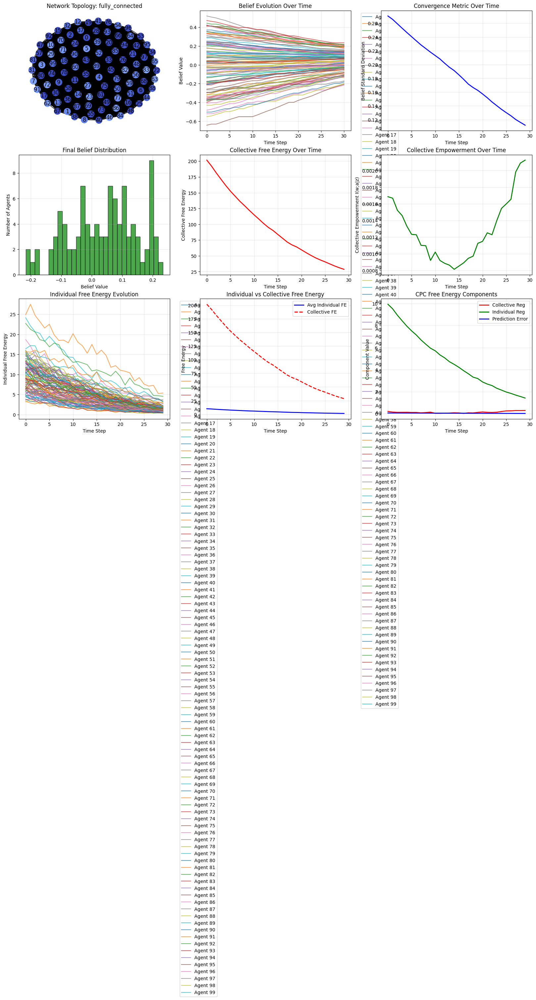

In [25]:
# Example 0: Fully Connected Network Simulation
async def run_fully_connected_network_example():
    """Example simulation with fully connected network"""
    
    # Configure simulation
    sim = BeliefFormationSimulation(
        num_agents=agents,
        topic="AI will significantly improve human life in the next decade",
        network_type=NetworkType.FULLY_CONNECTED,
        llm_config=LLMConfig(api_key=OPENAI_API_KEY)
    )
    
    # Run simulation
    results = await sim.run_full_simulation(
        num_steps=steps,
        interaction_rate=0.5,
        verbose=True
    )
    
    # Visualize results
    sim.visualize_results()
    
    return results

# Run the example
results = await run_fully_connected_network_example()

INFO:__main__:Starting simulation with 100 agents on random network
INFO:__main__:Topic: AI will significantly improve human life in the next decade
INFO:__main__:
=== Step 1/30 ===
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"

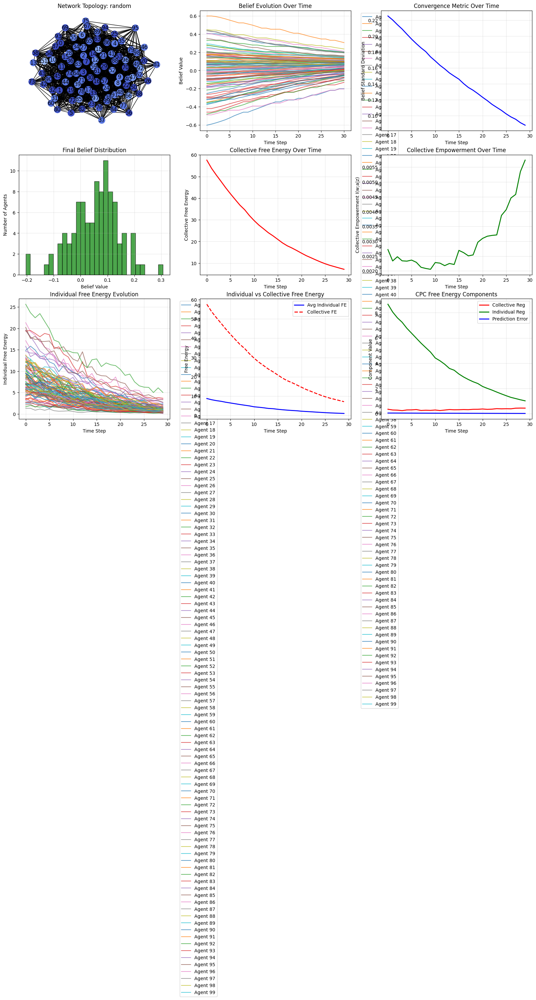

In [26]:
# Example 1: Random Network Simulation
async def run_random_network_example():
    """Example simulation with random network"""
    
    # Configure simulation
    sim = BeliefFormationSimulation(
        num_agents=agents,
        topic="AI will significantly improve human life in the next decade",
        network_type=NetworkType.RANDOM,
        edge_probability=0.3,
        llm_config=LLMConfig(api_key=OPENAI_API_KEY)
    )
    
    # Run simulation
    results = await sim.run_full_simulation(
        num_steps=steps,
        interaction_rate=0.5,
        verbose=True
    )
    
    # Visualize results
    sim.visualize_results()
    
    return results

# Run the example
results = await run_random_network_example()

INFO:__main__:Starting simulation with 100 agents on custom network
INFO:__main__:Topic: AI will significantly improve human life in the next decade
INFO:__main__:
=== Step 1/30 ===
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"

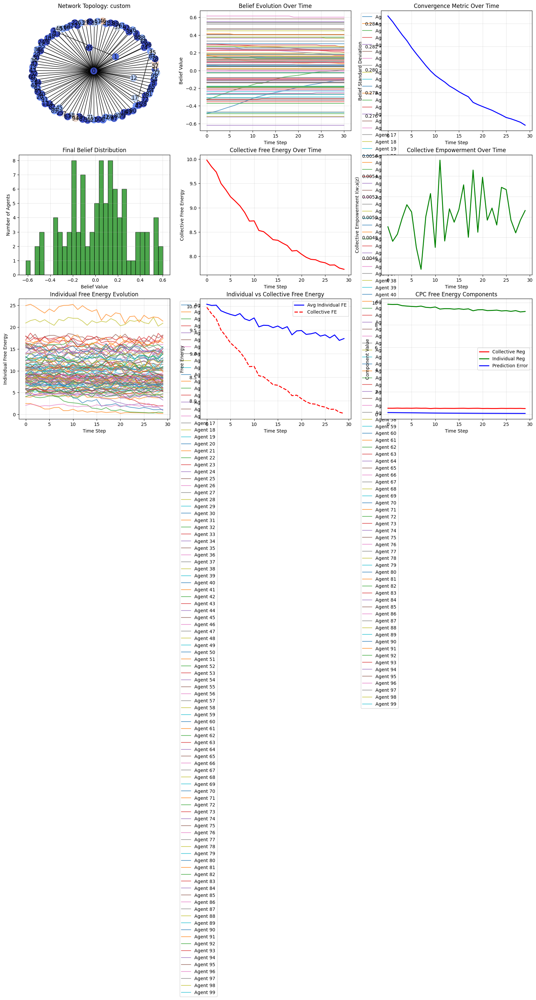

In [27]:
# Example 2: Custom Network from Adjacency Matrix
async def run_custom_network_example():
    """Example with custom network topology"""
    
    # Create a custom adjacency matrix (hub-and-spoke pattern)
    adj_matrix = np.zeros((agents, agents))
    
    # Create hub-and-spoke: agent 0 is connected to all others
    for i in range(1, agents):
        adj_matrix[0, i] = 1
        adj_matrix[i, 0] = 1
    
    # Add a few additional connections
    adj_matrix[1, 2] = adj_matrix[2, 1] = 1
    adj_matrix[3, 4] = adj_matrix[4, 3] = 1
    
    # Create simulation
    sim = BeliefFormationSimulation(
        num_agents=agents,
        topic="AI will significantly improve human life in the next decade",
        network_type=NetworkType.CUSTOM,
        adjacency_matrix=adj_matrix,
        llm_config=LLMConfig(api_key=OPENAI_API_KEY)
    )
    
    # Run simulation
    results = await sim.run_full_simulation(
        num_steps=steps,
        interaction_rate=0.7,
        verbose=True
    )
    
    # Show final results
    sim.visualize_results()
    
    return results

# Run the custom network example
custom_results = await run_custom_network_example()

INFO:__main__:Starting simulation with 100 agents on lattice network
INFO:__main__:Topic: AI will significantly improve human life in the next decade
INFO:__main__:
=== Step 1/30 ===
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK

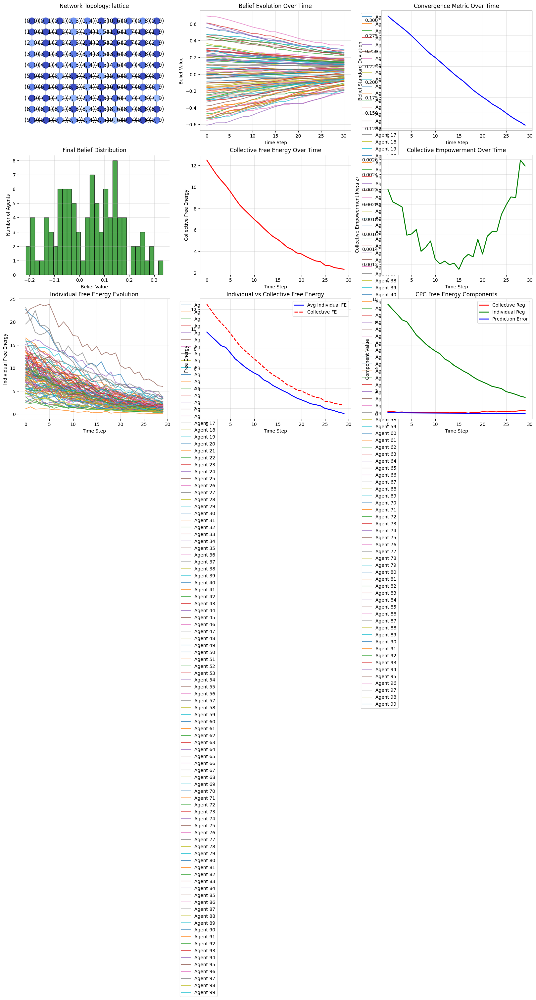


Simulation completed successfully!
Final convergence metric: 0.1299
Total conversations: 1090


In [28]:
# Example 3: LATTICE Network Simulation
async def run_lattice_network_example():
    """Quick start example to test the simulation"""
    
    # Create a simple simulation
    sim = BeliefFormationSimulation(
        num_agents=agents,  # 10x10 grid for lattice
        topic="AI will significantly improve human life in the next decade",
        network_type=NetworkType.LATTICE,
        llm_config=LLMConfig(api_key=OPENAI_API_KEY)
    )
    
    # Run for just a few steps
    results = await sim.run_full_simulation(
        num_steps=steps,
        interaction_rate=0.5,
        verbose=True
    )
    
    # Visualize
    sim.visualize_results()
    
    print("\nSimulation completed successfully!")
    print(f"Final convergence metric: {results['convergence_metrics'][-1]:.4f}")
    print(f"Total conversations: {results['total_conversations']}")

# Uncomment to run:
await run_lattice_network_example()

INFO:__main__:Starting simulation with 100 agents on small_world network
INFO:__main__:Topic: AI will significantly improve human life in the next decade
INFO:__main__:
=== Step 1/30 ===
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 20

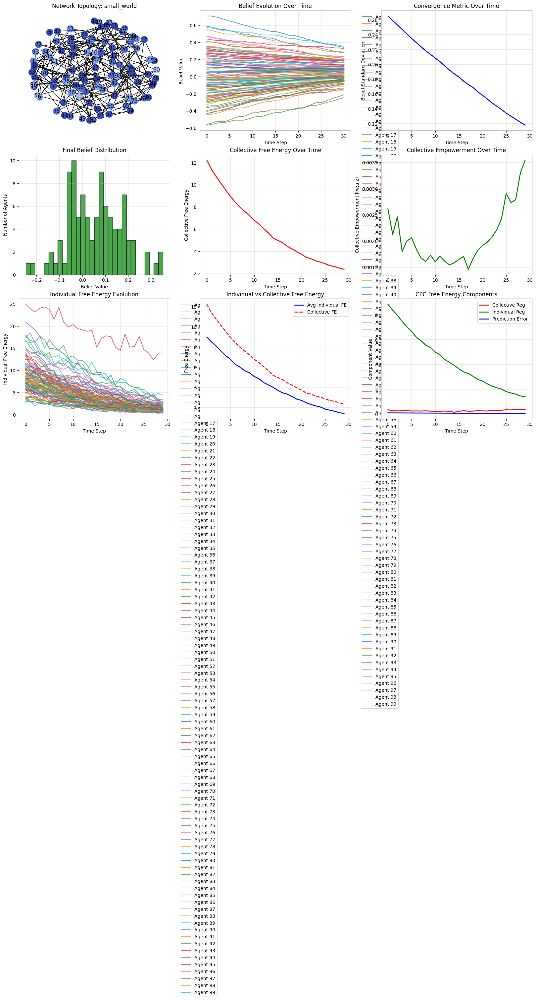


Simulation completed successfully!
Final convergence metric: 0.1177
Total conversations: 1072


In [29]:
# Example 4: SMALL_WORLD Network Simulation
async def run_small_world_network_example():
    """Quick start example to test the simulation"""
    
    # Create a simple simulation
    sim = BeliefFormationSimulation(
        num_agents=agents,  # 10x10 grid for lattice
        topic="AI will significantly improve human life in the next decade",
        network_type=NetworkType.SMALL_WORLD,
        llm_config=LLMConfig(api_key=OPENAI_API_KEY)
    )
    
    # Run for just a few steps
    results = await sim.run_full_simulation(
        num_steps=steps,
        interaction_rate=0.5,
        verbose=True
    )
    
    # Visualize
    sim.visualize_results()
    
    print("\nSimulation completed successfully!")
    print(f"Final convergence metric: {results['convergence_metrics'][-1]:.4f}")
    print(f"Total conversations: {results['total_conversations']}")

# Uncomment to run:
await run_small_world_network_example()

In [30]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

INFO:__main__:

Running simulation for lattice network...
INFO:__main__:Starting simulation with 100 agents on lattice network
INFO:__main__:Topic: AI will significantly improve human life in the next decade
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/com

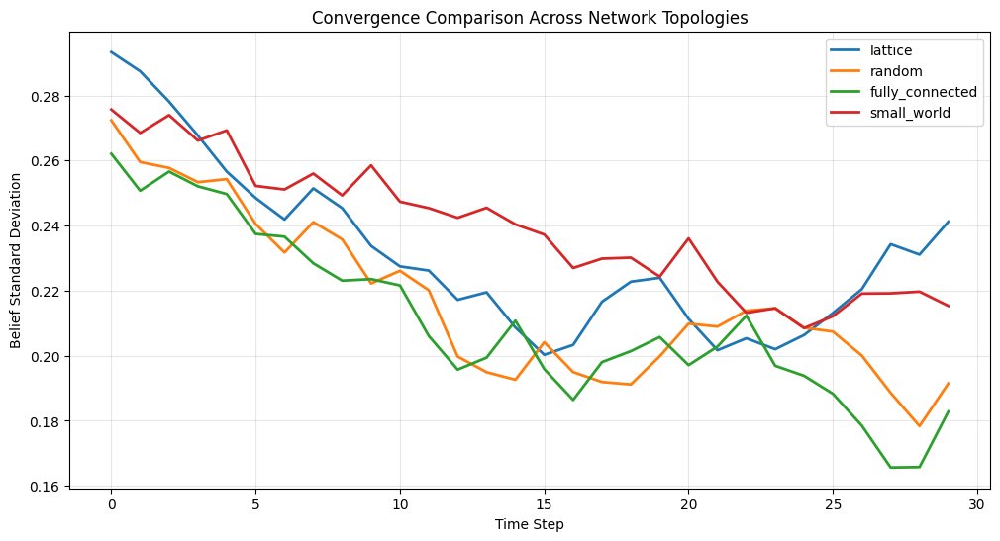


Summary of Results:
------------------------------------------------------------
Network Type         Final Std Dev   Final Mean Belief
------------------------------------------------------------
lattice              0.2412          0.3666         
random               0.1915          0.4225         
fully_connected      0.1829          0.3845         
small_world          0.2153          0.4635         


In [ ]:
# Example 4: Comparison of Different Network Topologies
async def compare_network_topologies():
    """Compare belief convergence across different network types"""
    
    network_configs = [
        (NetworkType.LATTICE, {}),
        (NetworkType.RANDOM, {'edge_probability': 0.3}),
        (NetworkType.FULLY_CONNECTED, {}),
        (NetworkType.SMALL_WORLD, {'k': 4, 'p': 0.3}),
    ]
    
    results_comparison = {}
    
    for network_type, kwargs in network_configs:
        logger.info(f"\n\nRunning simulation for {network_type.value} network...")
        
        sim = BeliefFormationSimulation(
            num_agents=agents,
            topic="AI will significantly improve human life in the next decade",
            network_type=network_type,
            **kwargs,
            llm_config=LLMConfig(api_key=OPENAI_API_KEY)
        )
        
        results = await sim.run_full_simulation(
            num_steps=steps,
            interaction_rate=0.5,
            verbose=False
        )
        
        results_comparison[network_type.value] = {
            'convergence_metrics': results['convergence_metrics'],
            'final_std': results['convergence_metrics'][-1],
            'final_mean_belief': np.mean(list(results['final_beliefs'].values()))
        }
    
    # Plot comparison
    plt.figure(figsize=(12, 6))
    
    for network_name, data in results_comparison.items():
        plt.plot(data['convergence_metrics'], label=network_name, linewidth=2)
    
    plt.xlabel('Time Step')
    plt.ylabel('Belief Standard Deviation')
    plt.title('Convergence Comparison Across Network Topologies')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Print summary
    print("\nSummary of Results:")
    print("-" * 60)
    print(f"{'Network Type':<20} {'Final Std Dev':<15} {'Final Mean Belief':<15}")
    print("-" * 60)
    for network_name, data in results_comparison.items():
        print(f"{network_name:<20} {data['final_std']:<15.4f} {data['final_mean_belief']:<15.4f}")
    
    return results_comparison

# Run the comparison
comparison_results = await compare_network_topologies()

### Running the Simulation

To run the simulation with your own LLM:

1. Implement the `LLMInterface.generate_response()` method with your preferred LLM API
2. Configure the `LLMConfig` with your API credentials
3. Run any of the example simulations

The simulation supports:
- **Asynchronous conversations**: Multiple agent pairs can converse simultaneously
- **Prompt-based belief updates**: LLMs determine their own belief changes
- **Flexible network topologies**: Choose from lattice, random, fully connected, small-world, scale-free, or custom networks